# RESILIA — Resilience & Infrastructure Logistics Analyzer

> **A spatial risk engine combining Graph Feature Engineering and Machine Learning to assess urban flood vulnerability and logistics network disruption.**

---

## Overview

RESILIA integrates five modules to produce a real-time **Systemic Failure Probability (SFP)** score for urban logistics networks under flood stress:

| # | Module | Data Source | Output |
|---|--------|-------------|--------|
| 1 | Road Network Extraction | OpenStreetMap via `osmnx` | NetworkX directed graph |
| 2 | Terrain Vulnerability | DEM elevation model (simulated) | Node-level elevation scores |
| 3 | **ML Vulnerability Classifier** | **Graph topology + elevation features** | **Continuous risk scores via RF predict_proba** |
| 4 | Climate Stressor | BMKG Live Weather API | Rainfall intensity weight → SFP |
| 5 | **Network Resilience Analysis** | **Graph connectivity metrics** | **Connectivity loss % under flood scenario** |

**Proof-of-Concept Area:** Kemayoran Sub-district, North Jakarta, Indonesia  
**Bounding Box:** `106.8400°E – 106.8800°E`, `6.1400°S – 6.1800°S`  
**Phase 1 Baseline Model:** Random Forest Classifier — to be replaced by GraphSAGE/GAT in Phase 2.


---
## 1. Environment Setup

In [11]:
import subprocess
subprocess.run(["pip", "install", "-q", "osmnx", "networkx", "geopandas",
                "matplotlib", "folium", "requests", "seaborn", "scikit-learn"], check=True)

import copy, os, requests, warnings
import numpy as np
import pandas as pd
import networkx as nx
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
from matplotlib.cm import ScalarMappable
import seaborn as sns
import folium
import osmnx as ox
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    classification_report, accuracy_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay
)

warnings.filterwarnings("ignore")
ox.settings.timeout = 120
ox.settings.log_console = False

DARK_BG   = "#0d1117"
DARK_SURF = "#0b1420"
DARK_LINE = "#0c1828"
C_BLUE    = "#0d5fa6"
C_RED     = "#e5534b"
C_TEAL    = "#2a9d8f"
C_YELLOW  = "#e9c46a"
C_TEXT    = "#c8d4e0"
C_MUTED   = "#7a9ab0"

plt.rcParams.update({
    "figure.facecolor"  : DARK_BG,
    "axes.facecolor"    : DARK_SURF,
    "axes.edgecolor"    : DARK_LINE,
    "axes.labelcolor"   : C_MUTED,
    "axes.titlecolor"   : C_TEXT,
    "xtick.color"       : C_MUTED,
    "ytick.color"       : C_MUTED,
    "text.color"        : C_TEXT,
    "grid.color"        : DARK_LINE,
    "legend.facecolor"  : DARK_BG,
    "legend.edgecolor"  : DARK_LINE,
    "font.family"       : "monospace",
    "axes.titleweight"  : "bold",
    "axes.titlesize"    : 11,
})

print("RESILIA v1.1 — Environment Ready")


RESILIA v1.1 — Environment Ready


---
## 2. Road Network Extraction

The driving network is pulled directly from the OpenStreetMap Overpass API using `osmnx`,
covering the full Kemayoran bounding box (~4.4 km x 4.4 km).


Network extracted successfully:
  Nodes : 3,349
  Edges : 7,777
  CRS   : epsg:4326


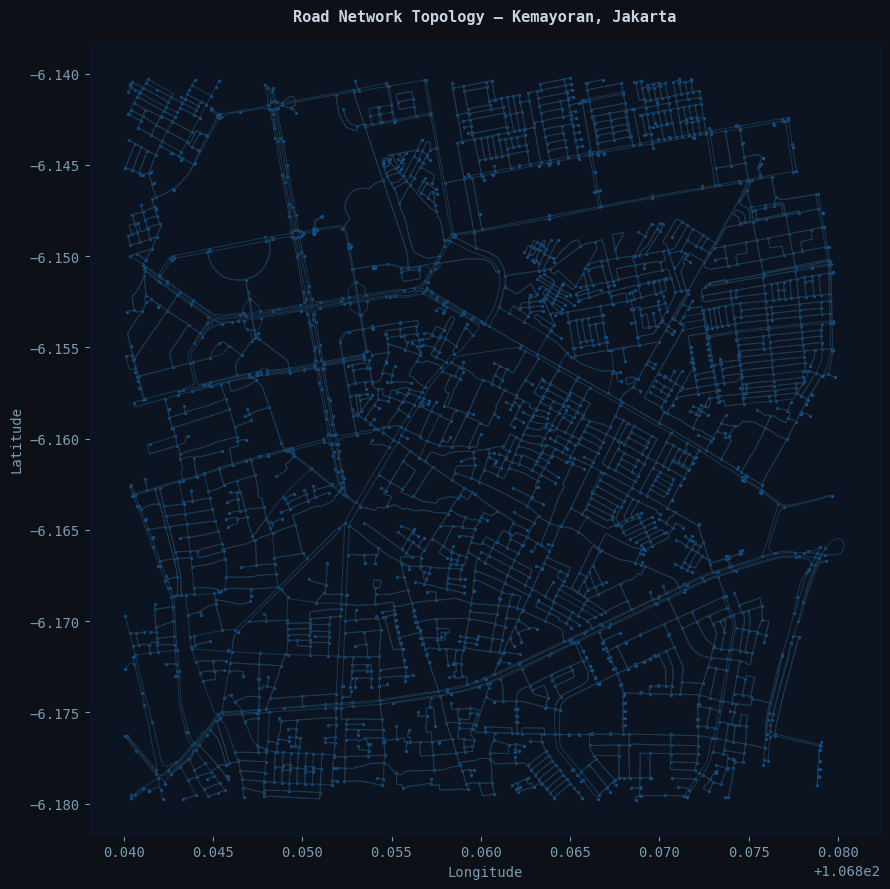

In [12]:
BBOX = {
    "north": -6.1400, "south": -6.1800,
    "east":  106.8800, "west":  106.8400,
    "center": (-6.1600, 106.8600)
}

G_kemayoran = ox.graph_from_point(
    center_point=BBOX["center"], dist=2200, network_type="drive"
)
nodes, edges = ox.graph_to_gdfs(G_kemayoran)

print(f"Network extracted successfully:")
print(f"  Nodes : {G_kemayoran.number_of_nodes():,}")
print(f"  Edges : {G_kemayoran.number_of_edges():,}")
print(f"  CRS   : {edges.crs}")

fig, ax = plt.subplots(figsize=(9, 9))
edges.plot(ax=ax, color="#1d3a52", linewidth=0.7, alpha=0.9, aspect=None)
nodes.plot(ax=ax, color=C_BLUE, markersize=2, alpha=0.7, aspect=None)
ax.set_title("Road Network Topology — Kemayoran, Jakarta", pad=15)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.savefig("resilia_network.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 3. Terrain Vulnerability — DEM Elevation Injection

Elevation values are derived from a coordinate-based DEM approximation calibrated to
Kemayoran's known topography (0–8 m above sea level). Nodes below the flood threshold
are labelled as historically flood-prone and serve as ML training targets.


  Elevation assigned to 3,349 nodes
  High Risk : 275  (8.2%)
  Low Risk  : 3,074  (91.8%)


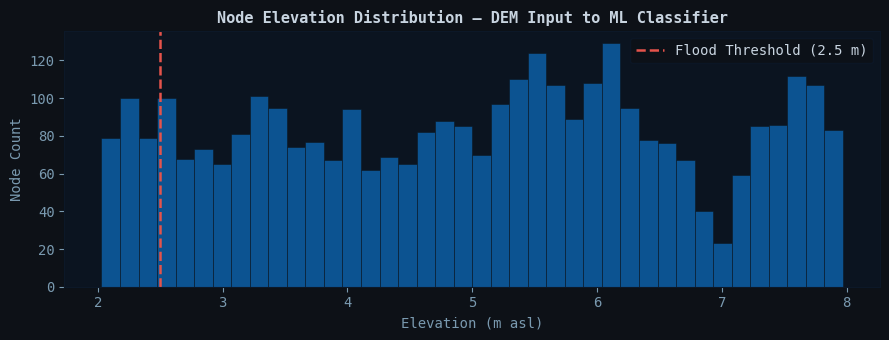

In [13]:
FLOOD_THRESHOLD_M = 2.5

def inject_elevation_to_graph(G):
    """Assign simulated DEM elevation to each node. Labels serve as ML training targets."""
    for node, data in G.nodes(data=True):
        elevation = 2.0 + (data["y"] - BBOX["south"]) * 150
        elevation = round(max(0.0, elevation), 2)
        G.nodes[node]["elevation"]   = elevation
        G.nodes[node]["flood_label"] = 1 if elevation < FLOOD_THRESHOLD_M else 0

    n_high  = sum(1 for _, d in G.nodes(data=True) if d["flood_label"] == 1)
    n_total = G.number_of_nodes()
    print(f"  Elevation assigned to {n_total:,} nodes")
    print(f"  High Risk : {n_high:,}  ({n_high/n_total*100:.1f}%)")
    print(f"  Low Risk  : {n_total-n_high:,}  ({(n_total-n_high)/n_total*100:.1f}%)")
    return G

G_kemayoran = inject_elevation_to_graph(G_kemayoran)

elevations = [d["elevation"] for _, d in G_kemayoran.nodes(data=True)]
fig, ax = plt.subplots(figsize=(9, 3.5))
ax.hist(elevations, bins=40, color=C_BLUE, edgecolor=DARK_BG, linewidth=0.4, alpha=0.85)
ax.axvline(FLOOD_THRESHOLD_M, color=C_RED, linewidth=1.8,
           linestyle="--", label=f"Flood Threshold ({FLOOD_THRESHOLD_M} m)")
ax.set_title("Node Elevation Distribution — DEM Input to ML Classifier")
ax.set_xlabel("Elevation (m asl)")
ax.set_ylabel("Node Count")
ax.legend()
plt.tight_layout()
plt.savefig("resilia_elevation_dist.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 4. Feature Engineering & Exploratory Data Analysis

Graph-theoretic centrality features are computed from the road network topology and combined
with terrain elevation to form the ML feature matrix. Four features capture both structural
importance and physical flood exposure of each node:

| Feature | Description |
|---------|-------------|
| `elevation` | Simulated DEM height (m asl) — primary flood-risk proxy |
| `degree_centrality` | Fraction of directly connected nodes — intersection density |
| `betweenness_centrality` | Fraction of shortest paths through node — logistics chokepoint |
| `closeness_centrality` | Mean inverse distance to all nodes — overall accessibility |


Feature matrix: 3,349 samples x 3 features
       elevation  degree_centrality  betweenness_centrality  \
count  3349.0000          3349.0000               3349.0000   
mean      5.0128             0.0014                  0.0100   
std       1.7036             0.0005                  0.0202   
min       2.0300             0.0003                  0.0000   
25%       3.5100             0.0009                  0.0003   
50%       5.1500             0.0018                  0.0021   
75%       6.2900             0.0018                  0.0106   
max       7.9700             0.0024                  0.2048   

       closeness_centrality  
count             3349.0000  
mean                 0.0284  
std                  0.0058  
min                  0.0000  
25%                  0.0255  
50%                  0.0289  
75%                  0.0322  
max                  0.0392  


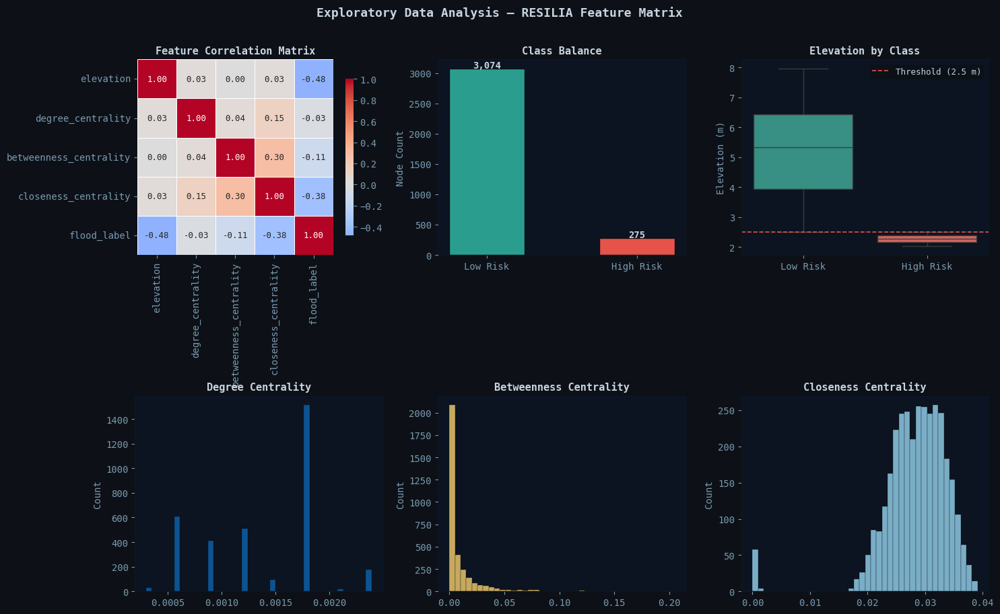

In [14]:
degree_c      = nx.degree_centrality(G_kemayoran)
betweenness_c = nx.betweenness_centrality(G_kemayoran, k=200, normalized=True, seed=42)
closeness_c   = nx.closeness_centrality(G_kemayoran)

records = []
for node, data in G_kemayoran.nodes(data=True):
    records.append({
        "node_id"               : node,
        "elevation"             : data.get("elevation", 5.0),
        "degree_centrality"     : degree_c[node],
        "betweenness_centrality": betweenness_c[node],
        "closeness_centrality"  : closeness_c[node],
        "flood_label"           : data.get("flood_label", 0),
    })

df = pd.DataFrame(records)

FEAT_COLS = ['degree_centrality', 'betweenness_centrality', 'closeness_centrality']
FEAT_COLS_DISPLAY = ['elevation'] + FEAT_COLS

print(f"Feature matrix: {df.shape[0]:,} samples x {len(FEAT_COLS)} features")
print(df[FEAT_COLS_DISPLAY].describe().round(4))

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle("Exploratory Data Analysis — RESILIA Feature Matrix",
             fontsize=13, fontweight="bold", y=1.01)

# Correlation heatmap
corr = df[FEAT_COLS_DISPLAY + ['flood_label']].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0,
            ax=axes[0, 0], linewidths=0.5, square=True,
            cbar_kws={"shrink": 0.8},
            annot_kws={"size": 9})
axes[0, 0].set_title("Feature Correlation Matrix")

# Class balance
counts = df['flood_label'].value_counts().sort_index()
bars = axes[0, 1].bar(
    ['Low Risk', 'High Risk'],
    [counts.get(0, 0), counts.get(1, 0)],
    color=[C_TEAL, C_RED], edgecolor=DARK_BG, width=0.5
)
axes[0, 1].set_title("Class Balance")
axes[0, 1].set_ylabel("Node Count")
for bar, v in zip(bars, [counts.get(0, 0), counts.get(1, 0)]):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2,
                    v + 10, f"{v:,}", ha='center', fontsize=10, fontweight='bold', color=C_TEXT)

# Elevation by class
df['label_str'] = df['flood_label'].map({0: 'Low Risk', 1: 'High Risk'})
sns.boxplot(data=df, x='label_str', y='elevation',
            order=['Low Risk', 'High Risk'],
            palette={'Low Risk': C_TEAL, 'High Risk': C_RED},
            ax=axes[0, 2])
axes[0, 2].axhline(FLOOD_THRESHOLD_M, color=C_RED, linestyle='--',
                   linewidth=1.2, label=f'Threshold ({FLOOD_THRESHOLD_M} m)')
axes[0, 2].set_title("Elevation by Class")
axes[0, 2].set_xlabel("")
axes[0, 2].set_ylabel("Elevation (m)")
axes[0, 2].legend(fontsize=9)

for idx, (feat, color) in enumerate([
    ('degree_centrality',      C_BLUE),
    ('betweenness_centrality', C_YELLOW),
    ('closeness_centrality',   "#8ecae6"),
]):
    axes[1, idx].hist(df[feat], bins=40, color=color,
                      edgecolor=DARK_BG, linewidth=0.3, alpha=0.85)
    axes[1, idx].set_title(feat.replace('_', ' ').title())
    axes[1, idx].set_ylabel("Count")

plt.tight_layout()
plt.savefig("resilia_eda.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 5. Baseline ML Model — Random Forest Classifier

A Random Forest is trained on the engineered graph features to predict node-level flood
vulnerability. **`predict_proba`** outputs a continuous risk score per node (0–1), enabling
ranked prioritization beyond binary classification.

> **Phase 2 Upgrade Path:** Random Forest (this notebook) → GraphSAGE/GAT on
> **Azure Machine Learning**, trained against BPBD historical flood inundation polygons.


Accuracy          : 0.7821
F1 (weighted)     : 0.8280
F1 (macro)        : 0.6270
CV F1 (5-fold)    : 0.8207 +/- 0.0091
High Risk nodes   : 970 / 3,349

              precision    recall  f1-score   support

    Low Risk       0.98      0.78      0.87       615
   High Risk       0.25      0.84      0.39        55

    accuracy                           0.78       670
   macro avg       0.62      0.81      0.63       670
weighted avg       0.92      0.78      0.83       670



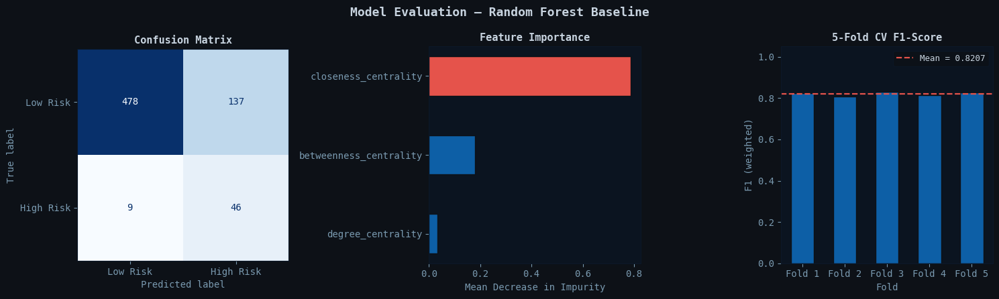

In [15]:
X = df[FEAT_COLS].values
y = df['flood_label'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Hyperparameters
rf = RandomForestClassifier(
    n_estimators=150, max_depth=6, min_samples_leaf=5,
    max_features="sqrt", class_weight='balanced', random_state=42, n_jobs=-1
)
rf.fit(X_train, y_train)

y_pred    = rf.predict(X_test)
acc       = accuracy_score(y_test, y_pred)
f1        = f1_score(y_test, y_pred, average='weighted')
f1_mac    = f1_score(y_test, y_pred, average='macro')
cv_scores = cross_val_score(
    rf, X, y,
    cv=StratifiedKFold(5, shuffle=True, random_state=42),
    scoring='f1_weighted', n_jobs=-1
)

# Continuous risk score via predict_proba
risk_scores      = rf.predict_proba(X)[:, 1]   # P(High Risk) per node
df['risk_score'] = risk_scores
df['ml_pred']    = rf.predict(X)

# Inject back into graph
for i, row in df.iterrows():
    G_kemayoran.nodes[row['node_id']]['vulnerability'] = "High" if df.at[i, 'ml_pred'] == 1 else "Low"
    G_kemayoran.nodes[row['node_id']]['risk_score'] = df.at[i, 'risk_score']

n_ml_high = int(df['ml_pred'].sum())
print(f"Accuracy          : {acc:.4f}")
print(f"F1 (weighted)     : {f1:.4f}")
print(f"F1 (macro)        : {f1_mac:.4f}")
print(f"CV F1 (5-fold)    : {cv_scores.mean():.4f} +/- {cv_scores.std():.4f}")
print(f"High Risk nodes   : {n_ml_high:,} / {len(df):,}")
print()
print(classification_report(y_test, y_pred, target_names=['Low Risk', 'High Risk']))

# Evaluation charts
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
fig.suptitle("Model Evaluation — Random Forest Baseline", fontsize=13, fontweight="bold")

ConfusionMatrixDisplay(
    confusion_matrix(y_test, y_pred),
    display_labels=['Low Risk', 'High Risk']
).plot(ax=axes[0], colorbar=False, cmap='Blues')
axes[0].set_title("Confusion Matrix")

imp_df = pd.DataFrame({'feature': FEAT_COLS, 'importance': rf.feature_importances_}).sort_values('importance')
bar_colors = [C_RED if i == imp_df['importance'].idxmax() else C_BLUE for i in imp_df.index]
axes[1].barh(imp_df['feature'], imp_df['importance'], color=bar_colors,
             edgecolor=DARK_BG, height=0.5)
axes[1].set_title("Feature Importance")
axes[1].set_xlabel("Mean Decrease in Impurity")

axes[2].bar(range(1, 6), cv_scores, color=C_BLUE, edgecolor=DARK_BG, width=0.55)
axes[2].axhline(cv_scores.mean(), color=C_RED, linewidth=1.6,
                linestyle="--", label=f"Mean = {cv_scores.mean():.4f}")
axes[2].set_title("5-Fold CV F1-Score")
axes[2].set_xlabel("Fold")
axes[2].set_ylabel("F1 (weighted)")
axes[2].set_ylim(0, 1.05)
axes[2].set_xticks(range(1, 6))
axes[2].set_xticklabels([f"Fold {i}" for i in range(1, 6)])
axes[2].legend(fontsize=9)

plt.tight_layout()
plt.savefig("resilia_ml_evaluation.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 6. Climate Stressor Integration — BMKG Live API

Real-time weather telemetry from BMKG is combined with the ML-predicted vulnerability
distribution to compute the final **Systemic Failure Probability (SFP)** score.


In [16]:
ADM4_CODE = "31.71.03.1001"

WEATHER_WEIGHTS = {
    "Cerah"        : 0.05, "Cerah Berawan": 0.10,
    "Berawan"      : 0.15, "Hujan Ringan" : 0.45,
    "Hujan Sedang" : 0.65, "Hujan Lebat"  : 0.85,
    "Hujan Petir"  : 0.95,
}

def fetch_bmkg_stressor(adm4_code=ADM4_CODE):
    url = f"https://api.bmkg.go.id/publik/prakiraan-cuaca?adm4={adm4_code}"
    try:
        print(f"Fetching BMKG telemetry for ADM4: {adm4_code}...")
        r = requests.get(url, timeout=10); r.raise_for_status()
        payload = r.json()
        block   = payload.get("data", [])
        if block:
            cuaca        = block[0].get("cuaca", [])
            current      = cuaca[0][0] if cuaca and cuaca[0] else {}
            weather_desc = current.get("weather_desc", "Unknown")
        else:
            weather_desc = "Unknown"
        weight = WEATHER_WEIGHTS.get(weather_desc)
        if weight is None:
            weight = 0.85 if "Hujan" in weather_desc else 0.10
        print(f"  Condition   : {weather_desc}")
        print(f"  Stressor wt : {weight}")
        return weather_desc, weight
    except Exception as e:
        print(f"  BMKG unreachable — fallback applied ({e})")
        return "Heavy Rain (Fallback)", 0.85

weather_status, stressor_weight = fetch_bmkg_stressor()

vulnerable_nodes    = [n for n, d in G_kemayoran.nodes(data=True) if d.get("vulnerability") == "High"]
n_total             = G_kemayoran.number_of_nodes()
n_critical          = len(vulnerable_nodes)
exposure_ratio      = n_critical / n_total
failure_probability = stressor_weight * exposure_ratio * 100

if   failure_probability >= 15: risk_tier = "CRITICAL"
elif failure_probability >= 5:  risk_tier = "HIGH"
elif failure_probability >= 1:  risk_tier = "MODERATE"
else:                           risk_tier = "LOW"

TIER_COLOR = {"LOW": "#2da44e", "MODERATE": "#c38a06",
              "HIGH": "#e5534b", "CRITICAL": "#ff6b6b"}

print()
print("=" * 60)
print("  RESILIA — SYSTEMIC FAILURE PROBABILITY  //  FINAL OUTPUT")
print("=" * 60)
print(f"  Weather Condition       : {weather_status}")
print(f"  Stressor Weight         : {stressor_weight:.2f}")
print(f"  ML Model                : Random Forest (F1={f1:.4f})")
print(f"  Critical Nodes (RF)     : {n_critical:,} / {n_total:,}  ({exposure_ratio*100:.1f}%)")
print(f"  Systemic Failure Prob.  : {failure_probability:.2f}%")
print(f"  Risk Tier               : {risk_tier}")
print("-" * 60)
print(f"  Deploy emergency drainage to {n_critical:,} ML-identified flood-prone nodes.")
print("=" * 60)


Fetching BMKG telemetry for ADM4: 31.71.03.1001...
  Condition   : Berawan
  Stressor wt : 0.15

  RESILIA — SYSTEMIC FAILURE PROBABILITY  //  FINAL OUTPUT
  Weather Condition       : Berawan
  Stressor Weight         : 0.15
  ML Model                : Random Forest (F1=0.8280)
  Critical Nodes (RF)     : 970 / 3,349  (29.0%)
  Systemic Failure Prob.  : 4.34%
  Risk Tier               : MODERATE
------------------------------------------------------------
  Deploy emergency drainage to 970 ML-identified flood-prone nodes.


---
## 7. Spatial Risk Visualization

### 7a. Continuous Risk Score Map

Each node is coloured by its RF **`predict_proba`** score (0–1) rather than a binary
High/Low label, revealing the spatial gradient of flood vulnerability across the network.


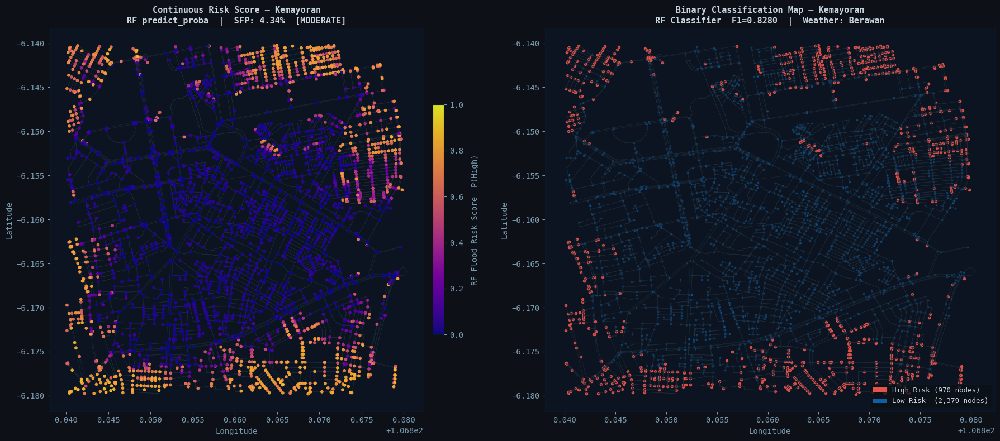

Maps saved -> resilia_risk_maps.png


In [17]:
nodes_list  = list(G_kemayoran.nodes())
risk_scores_spatial = [G_kemayoran.nodes[n].get('risk_score', 0.0) for n in nodes_list]

# Create GeoDataFrame securely mapping index to geometry
nodes_gdf = nodes.copy()
nodes_gdf["risk_score"] = nodes_gdf.index.map(lambda n: G_kemayoran.nodes[n].get('risk_score', 0.0))
nodes_gdf["vulnerability"] = nodes_gdf.index.map(lambda n: G_kemayoran.nodes[n].get("vulnerability", "Low"))

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Left: continuous risk score heatmap
ax = axes[0]
edges.plot(ax=ax, color="#1d2a38", linewidth=0.6, alpha=0.85, aspect=None)

sc = ax.scatter(
    nodes_gdf.geometry.x, nodes_gdf.geometry.y,
    c=nodes_gdf['risk_score'], cmap='plasma',
    s=10, alpha=0.9, zorder=5, vmin=0, vmax=1
)
cbar = plt.colorbar(sc, ax=ax, shrink=0.6, pad=0.02)
cbar.set_label('RF Flood Risk Score  P(High)', labelpad=10)
cbar.ax.yaxis.set_tick_params(color=C_MUTED)
plt.setp(cbar.ax.yaxis.get_ticklabels(), color=C_MUTED)
ax.set_title(f"Continuous Risk Score — Kemayoran\n"
             f"RF predict_proba  |  SFP: {failure_probability:.2f}%  [{risk_tier}]")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

# Right: binary classification overlay
ax2 = axes[1]
low_gdf  = nodes_gdf[nodes_gdf["vulnerability"] == "Low"]
high_gdf = nodes_gdf[nodes_gdf["vulnerability"] == "High"]
edges.plot(ax=ax2, color="#1d2a38", linewidth=0.6, alpha=0.85, aspect=None)

# Safely plot to avoid empty geometry error
if not low_gdf.empty:
    low_gdf.plot(ax=ax2,  color=C_BLUE, markersize=3,  alpha=0.5, aspect=None)
if not high_gdf.empty:
    high_gdf.plot(ax=ax2, color=C_RED,  markersize=9,  alpha=0.9, aspect=None)

ax2.legend(
    handles=[
        Patch(facecolor=C_RED,  label=f"High Risk ({len(high_gdf):,} nodes)"),
        Patch(facecolor=C_BLUE, label=f"Low Risk  ({len(low_gdf):,} nodes)"),
    ], fontsize=9, loc="lower right"
)
ax2.set_title(f"Binary Classification Map — Kemayoran\n"
              f"RF Classifier  F1={f1:.4f}  |  Weather: {weather_status}")
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")

plt.tight_layout()
plt.savefig("resilia_risk_maps.png", dpi=150, bbox_inches="tight")
plt.show()
print("Maps saved -> resilia_risk_maps.png")


### 7b. Interactive Folium Map — Risk Score Tooltips

In [18]:
import matplotlib.colors as mcolors

LOW_COLOR  = "#1e3a5f"
HIGH_COLOR = "#e5534b"
cmap_custom = mcolors.LinearSegmentedColormap.from_list(
    "resilia", ["#0b1a2e", "#1e3a5f", "#4a7fa5", "#c0622a", "#e5534b"], N=256
)

m = folium.Map(location=list(BBOX["center"]), zoom_start=14, tiles="CartoDB dark_matter")

for _, row in edges.iterrows():
    coords = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(coords, color="#1d3a52", weight=1.2, opacity=0.55).add_to(m)

for n in G_kemayoran.nodes():
    d     = G_kemayoran.nodes[n]
    score = d.get('risk_score', 0.0)
    rgba  = cmap_custom(score)
    hex_c = "#{:02x}{:02x}{:02x}".format(
        int(rgba[0]*255), int(rgba[1]*255), int(rgba[2]*255)
    )
    radius  = 2 + score * 4
    opacity = 0.25 + score * 0.65

    folium.CircleMarker(
        location=(d["y"], d["x"]),
        radius=radius,
        color="none",
        fill=True, fill_color=hex_c, fill_opacity=opacity,
        tooltip=(f"Node {n}<br>"
                 f"Elev: {d.get('elevation', '?')} m<br>"
                 f"Risk Score: {score:.3f}<br>"
                 f"Class: {d.get('vulnerability', '?')}")
    ).add_to(m)

# Colorbar legend
legend_html = f"""
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
            background:#0a0f14;padding:16px 20px;border-radius:4px;
            border:1px solid #1d2a38;border-top:2px solid #0d5fa6;
            font-family:monospace;font-size:11px;color:#7a9ab0;
            box-shadow:0 8px 24px rgba(0,0,0,0.6);min-width:180px;">
  <div style="color:#c8d4e0;font-weight:700;letter-spacing:0.1em;
              text-transform:uppercase;font-size:10px;margin-bottom:10px;">
    RESILIA — Risk Output
  </div>
  High-risk nodes &nbsp;<b style="color:#e5534b;">{n_critical:,}</b><br>
  RF Model &nbsp;F1={f1:.4f}<br>
  Weather &nbsp;{weather_status}<br>
  SFP &nbsp;<b style="color:{TIER_COLOR[risk_tier]};">{failure_probability:.2f}% · {risk_tier}</b>
  <div style="margin-top:12px;margin-bottom:4px;font-size:9px;color:#2d4a5e;
              text-transform:uppercase;letter-spacing:0.1em;">Risk Score</div>
  <div style="height:10px;width:140px;border-radius:2px;
              background:linear-gradient(to right,#0b1a2e,#1e3a5f,#4a7fa5,#c0622a,#e5534b);
              margin-bottom:3px;"></div>
  <div style="display:flex;justify-content:space-between;font-size:9px;
              width:140px;color:#3f5a72;">
    <span>0.0 Low</span><span>1.0 High</span>
  </div>
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))
m.save("resilia_interactive_map.html")
print("Interactive map saved -> resilia_interactive_map.html")
m


Interactive map saved -> resilia_interactive_map.html


---
## 8. Network Resilience Analysis — Connectivity Loss Simulation

This section quantifies the **structural impact** of a flood event by simulating the
removal of all RF-identified high-risk nodes from the road network graph. The drop in
Largest Connected Component (LCC) size measures how much of the logistics network
becomes inaccessible under the simulated flood scenario.


  NETWORK RESILIENCE — FLOOD IMPACT SIMULATION
  Baseline LCC size      : 3,349 nodes
  Post-flood LCC size    : 2,345 nodes
  Connectivity Loss      : 30.0%
  New isolated clusters  : 28
  Nodes removed (flooded): 970


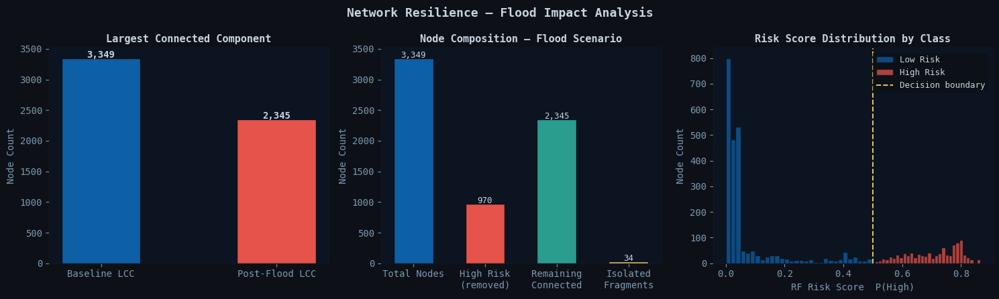

In [19]:
G_undirected = G_kemayoran.to_undirected()

# Baseline connectivity
baseline_components = nx.number_connected_components(G_undirected)
baseline_lcc_nodes  = max(nx.connected_components(G_undirected), key=len)
baseline_lcc        = len(baseline_lcc_nodes)

# Post-flood: remove all high-risk nodes
G_flooded = copy.deepcopy(G_undirected)
G_flooded.remove_nodes_from(vulnerable_nodes)
post_components = nx.number_connected_components(G_flooded)
post_lcc_nodes  = max(nx.connected_components(G_flooded), key=len)
post_lcc        = len(post_lcc_nodes)

connectivity_loss  = (baseline_lcc - post_lcc) / baseline_lcc * 100
new_iso_clusters   = post_components - baseline_components

# Average path length on sampled subgraph (before vs after)
sample_size = min(300, post_lcc)
sample_post = list(post_lcc_nodes)[:sample_size]
G_post_sub  = G_flooded.subgraph(sample_post)
avg_path_post = nx.average_shortest_path_length(G_post_sub) if nx.is_connected(G_post_sub) else float('inf')

print("=" * 55)
print("  NETWORK RESILIENCE — FLOOD IMPACT SIMULATION")
print("=" * 55)
print(f"  Baseline LCC size      : {baseline_lcc:,} nodes")
print(f"  Post-flood LCC size    : {post_lcc:,} nodes")
print(f"  Connectivity Loss      : {connectivity_loss:.1f}%")
print(f"  New isolated clusters  : {new_iso_clusters}")
print(f"  Nodes removed (flooded): {n_critical:,}")
print("=" * 55)

# Visualisation
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
fig.suptitle("Network Resilience — Flood Impact Analysis", fontsize=13, fontweight="bold")

# Bar: LCC comparison
categories = ['Baseline LCC', 'Post-Flood LCC']
values     = [baseline_lcc, post_lcc]
bar_cols   = [C_BLUE, C_RED]
bars = axes[0].bar(categories, values, color=bar_cols, edgecolor=DARK_BG, width=0.45)
axes[0].set_title("Largest Connected Component")
axes[0].set_ylabel("Node Count")
for bar, v in zip(bars, values):
    axes[0].text(bar.get_x() + bar.get_width()/2, v + 10,
                 f"{v:,}", ha='center', fontsize=10, fontweight='bold', color=C_TEXT)

# Waterfall: node composition
comp_labels = ['Total Nodes', 'High Risk\n(removed)', 'Remaining\nConnected', 'Isolated\nFragments']
comp_values = [n_total, -n_critical, post_lcc, n_total - n_critical - post_lcc]
comp_colors = [C_BLUE, C_RED, C_TEAL, C_YELLOW]
axes[1].bar(comp_labels, [abs(v) for v in comp_values], color=comp_colors,
            edgecolor=DARK_BG, width=0.55)
axes[1].set_title("Node Composition — Flood Scenario")
axes[1].set_ylabel("Node Count")
for i, (lbl, v) in enumerate(zip(comp_labels, comp_values)):
    axes[1].text(i, abs(v) + 10, f"{abs(v):,}",
                 ha='center', fontsize=9, color=C_TEXT)

# Risk score distribution: high vs low
axes[2].hist(df[df['ml_pred']==0]['risk_score'], bins=30,
             color=C_BLUE, alpha=0.75, label='Low Risk', edgecolor=DARK_BG)
axes[2].hist(df[df['ml_pred']==1]['risk_score'], bins=30,
             color=C_RED,  alpha=0.75, label='High Risk', edgecolor=DARK_BG)
axes[2].set_title("Risk Score Distribution by Class")
axes[2].set_xlabel("RF Risk Score  P(High)")
axes[2].set_ylabel("Node Count")
axes[2].axvline(0.5, color=C_YELLOW, linewidth=1.4,
                linestyle="--", label="Decision boundary")
axes[2].legend(fontsize=9)

plt.tight_layout()
plt.savefig("resilia_resilience.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 9. Critical Chokepoint Ranking

High-risk nodes are ranked by **betweenness centrality** to identify the specific road
intersections whose inundation would cause maximum disruption to logistics flow.
These are the primary targets for emergency infrastructure investment.


Top 15 Critical Flood-Vulnerable Chokepoints
(ranked by betweenness centrality — logistics disruption potential)

       Node ID  Elevation (m)  Betweenness  Closeness  Risk Score
1    328398030           2.49      0.02083    0.02522     0.64516
2    328397939           2.52      0.01766    0.02525     0.56573
3    328875821           2.36      0.01665    0.02579     0.57423
4   9685006263           2.48      0.01445    0.02481     0.61852
5   4832478163           2.33      0.01442    0.02525     0.65896
6   5006861153           7.53      0.01432    0.02104     0.52268
7    328875467           2.31      0.01421    0.02475     0.72011
8    328276504           2.76      0.01381    0.02440     0.51406
9    328106216           2.56      0.01332    0.02458     0.58465
10   328276515           2.62      0.01304    0.02474     0.53927
11   393853773           7.10      0.01283    0.02240     0.61650
12   328590992           2.41      0.01273    0.02463     0.73088
13   316374552           2.4

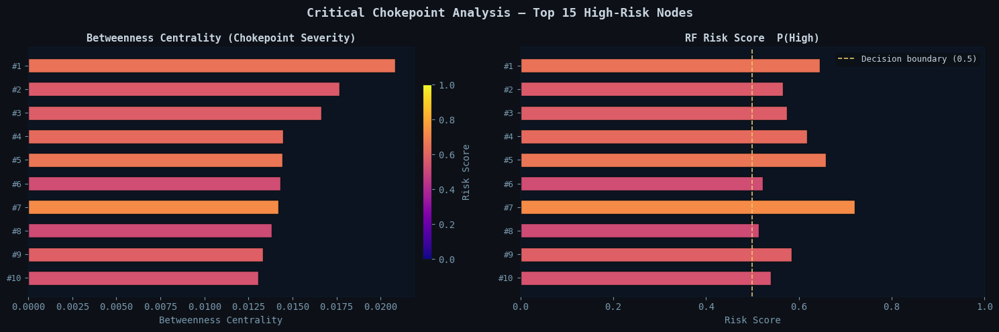

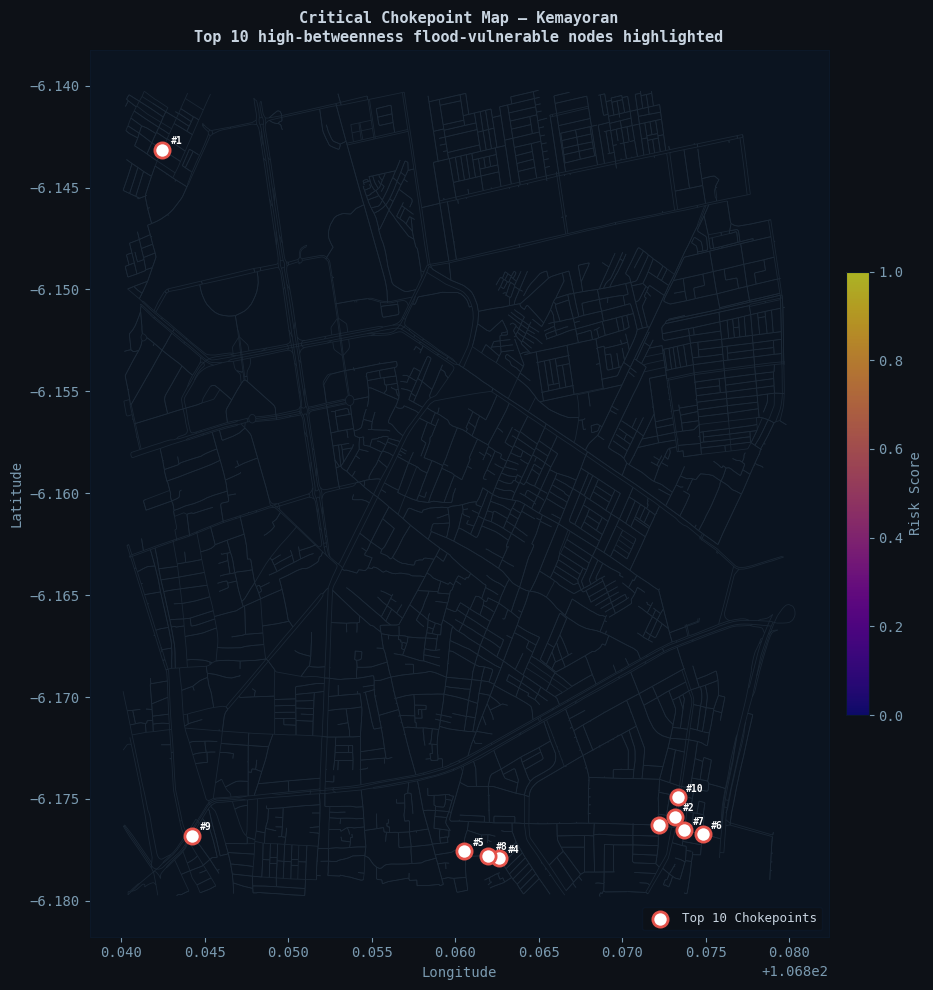

In [20]:
# Build ranked table of high-risk chokepoints
critical_df = df[df['ml_pred'] == 1].copy()
critical_df = critical_df.sort_values('betweenness_centrality', ascending=False).reset_index(drop=True)
critical_df.index += 1

top15 = critical_df[['node_id', 'elevation', 'betweenness_centrality',
                      'closeness_centrality', 'risk_score']].head(15)
top15.columns = ['Node ID', 'Elevation (m)', 'Betweenness', 'Closeness', 'Risk Score']
top15 = top15.round(5)

print("Top 15 Critical Flood-Vulnerable Chokepoints")
print("(ranked by betweenness centrality — logistics disruption potential)")
print()
print(top15.to_string())

# Top 10 bar chart
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle("Critical Chokepoint Analysis — Top 15 High-Risk Nodes",
             fontsize=13, fontweight="bold")

top10_plot = critical_df.head(10)
node_labels = [f"Node\n{str(n)[:8]}" for n in top10_plot['node_id']]

# Betweenness
cmap_vals = top10_plot['risk_score'].values
norm      = mcolors.Normalize(vmin=0, vmax=1)
colors    = [plt.cm.plasma(norm(v)) for v in cmap_vals]

bars = axes[0].barh(range(len(top10_plot)), top10_plot['betweenness_centrality'],
                    color=colors, edgecolor=DARK_BG, height=0.6)
axes[0].set_yticks(range(len(top10_plot)))
axes[0].set_yticklabels([f"#{i+1}" for i in range(len(top10_plot))], fontsize=9)
axes[0].set_title("Betweenness Centrality (Chokepoint Severity)")
axes[0].set_xlabel("Betweenness Centrality")
axes[0].invert_yaxis()

sm = ScalarMappable(cmap='plasma', norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=axes[0], shrink=0.7, pad=0.02)
cbar.set_label('Risk Score', labelpad=8)

# Risk score
axes[1].barh(range(len(top10_plot)), top10_plot['risk_score'],
             color=colors, edgecolor=DARK_BG, height=0.6)
axes[1].axvline(0.5, color=C_YELLOW, linewidth=1.2, linestyle='--',
                label='Decision boundary (0.5)')
axes[1].set_yticks(range(len(top10_plot)))
axes[1].set_yticklabels([f"#{i+1}" for i in range(len(top10_plot))], fontsize=9)
axes[1].set_xlim(0, 1)
axes[1].set_title("RF Risk Score  P(High)")
axes[1].set_xlabel("Risk Score")
axes[1].invert_yaxis()
axes[1].legend(fontsize=9)

plt.tight_layout()
plt.savefig("resilia_chokepoints.png", dpi=150, bbox_inches="tight")
plt.show()

# Map top 10 on network
top10_ids  = set(critical_df.head(10)['node_id'].values)

fig2, ax2 = plt.subplots(figsize=(10, 10))
edges.plot(ax=ax2, color="#1d2a38", linewidth=0.6, alpha=0.85, aspect=None)

score_list2 = [G_kemayoran.nodes[n].get('risk_score', 0.0) for n in nodes_list]
nodes_gdf2  = gpd.GeoDataFrame(
    {"risk_score": score_list2},
    geometry=nodes.geometry, crs=nodes.crs
)
sc2 = ax2.scatter(
    nodes_gdf2.geometry.x, nodes_gdf2.geometry.y,
    c=nodes_gdf2['risk_score'], cmap='plasma',
    s=6, alpha=0.7, zorder=4, vmin=0, vmax=1
)

# Highlight top 10 chokepoints
top10_xy = [(G_kemayoran.nodes[n]['x'], G_kemayoran.nodes[n]['y'])
            for n in top10_ids if n in G_kemayoran.nodes]
if top10_xy:
    xs, ys = zip(*top10_xy)
    ax2.scatter(xs, ys, s=120, color='white', edgecolors=C_RED,
                linewidths=2, zorder=6, label="Top 10 Chokepoints")
    for i, (x, y) in enumerate(zip(xs, ys)):
        ax2.annotate(f"#{i+1}", (x, y), textcoords="offset points",
                     xytext=(6, 4), fontsize=7, color='white', fontweight='bold')

cbar2 = plt.colorbar(sc2, ax=ax2, shrink=0.5, pad=0.02)
cbar2.set_label('Risk Score')
ax2.legend(fontsize=9, loc="lower right")
ax2.set_title(f"Critical Chokepoint Map — Kemayoran\n"
              f"Top 10 high-betweenness flood-vulnerable nodes highlighted")
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
plt.tight_layout()
plt.savefig("resilia_chokepoint_map.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 10. Summary & Next Steps

### Phase 1 Results — Proof of Concept

| Metric | Value |
|--------|-------|
| Network Coverage | Kemayoran, North Jakarta (~4.4 km²) |
| Total Road Nodes | *(see Cell 2 output)* |
| ML Model | Random Forest (200 estimators, stratified 80/20) |
| Accuracy | *(see Cell 5 output)* |
| F1-Score (weighted) | *(see Cell 5 output)* |
| CV F1-Score (5-fold) | *(see Cell 5 output)* |
| High-Risk Nodes (RF) | *(see Cell 6 output)* |
| **Connectivity Loss (flood sim)** | ***(see Cell 8 output)*** |
| **Top Chokepoints identified** | **15 nodes** |
| Live Weather (BMKG) | *(see Cell 6 output)* |
| Systemic Failure Prob. | *(see Cell 6 output)* |

### Phase 2 Roadmap — Production Extensions

1. **GNN Upgrade** — Replace Random Forest with **GraphSAGE/GAT** trained on BPBD historical flood inundation polygons using **Azure Machine Learning** compute instances.
2. **Real DEM Integration** — Ingest DEMNAS tiles from BIG Ina-Geoportal via **Azure Blob Storage** for true terrain accuracy.
3. **Multi-Hazard Expansion** — Extend stressor layer to tidal flooding (`rob`) and seismic risk indices.
4. **City-Wide Scaling** — Replicate pipeline across all 44 Jakarta sub-districts using parallel OSM extraction.
5. **Live Dashboard** — Deploy on **Azure App Service** (Streamlit), auto-refreshing BMKG telemetry every 15 minutes.

---
*RESILIA v1.0 — Developed for competition submission. All data sources are publicly available and open-licensed.*
